In [20]:
from sklearn import svm
from sklearn import metrics
from sklearn import datasets
from sklearn import model_selection
from sklearn.datasets import make_circles
import os
os. environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
#TF_CPP_MIN_LOG_LEVEL: 텐서 플로우 로그
#0: 모든 로그 출력(default)
#1: INFO 로그 필터
#2: INFO, WARNING 로그 필터
#3: INFO, WARNING, ERROR 로그 필터

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from cvxopt import matrix, solvers
import plotly.graph_objects as go
from numba import njit

from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    average_precision_score,
    roc_curve,
    precision_recall_curve,
    auc
)

from matplotlib.colors import TwoSlopeNorm


데이터 및 상수 생성

In [21]:
# iris = make_moons()
# iris data 불러오기
# X_train, X_test, y_train, y_test = model_selection.train_test_split(iris.data[:, :], iris.target[:], test_size = 0.8, random_state = 42)
#test_size: iris.data와 iris.target의 데이터 중 60%를 X_test와 y_test에 분배, 나머지 40%를 X_train과 y_train에 분배
#random_state: iris.data, iris.target의 데이터를 랜덤으로 믹스
# 즉, 데이터를 랜덤하게 섞은 후 test_size = 0.6에 맞춰서 분배

n_train = 50

X, Y = make_circles(n_samples = 200, noise=0.1, random_state = 5)
X_train = X[:n_train, :]
X_test = X[n_train:, :]
y_train = Y[:n_train] 
y_test = Y[n_train:]

y_train = 2 * y_train - 1
y_test = 2 * y_test - 1

In [22]:
N_train = X_train.shape[0]

Solver 구하기

In [23]:
@njit
def Gaussian_kernel(n, m, gamma, X_1, X_2):
    K = np.exp(-1 * gamma * ((X_1[n, :] - X_2[m, :]) @ (X_1[n, :] - X_2[m, :])))

    return(K)

In [24]:
def Solver_SVM (P, q, G, h, A, b):
    sol = solvers.qp(
    matrix(P),
    matrix(q),
    matrix(G),
    matrix(h),
    matrix(A, tc = "d"),
    matrix(b, tc = "d")
    )

    return(sol)

학습

In [25]:
def Solver_Parameter():
    I = np.identity(N_train)

    K_train_train = np.zeros((N_train, N_train))

    for n in range(N_train):
        for m in range(N_train):
            K_train_train[n, m] = Gaussian_kernel(n, m, gamma,  X_train, X_train)

    Y = np.diag(y_train)
    P = Y @ K_train_train @ Y
    q = q = -np.ones((N_train, 1))

    G = np.vstack([-I, I])
    h = np.hstack([np.zeros(N_train), C*np.ones(N_train)])

    A = y_train.astype(float).reshape(1, N_train)
    b = np.array([0.0])

    return P, q, G, h, A, b, K_train_train

In [26]:
@njit
def Gaussian_Parameter(i, gamma, z, X_train):
    # z: (2,), X_train: (N,2)
    diff = X_train[i, :] - z              # (2,)
    return np.exp(-gamma * (diff @ diff))

In [27]:
@njit
def Gaussian_HyperPlane(xx, yy, X_train, y_train, alpha, gamma, b):
    # 타입/shape 안정화 (매우 중요)
    X_train = np.asarray(X_train, dtype=np.float64)
    y_train = np.asarray(y_train, dtype=np.float64).ravel()
    alpha   = np.asarray(alpha,   dtype=np.float64).ravel()
    HP = np.where((alpha > 0) & (alpha < C))[0]
    gamma   = float(gamma)
    b       = float(b)

    N = X_train.shape[0]
    Z = np.zeros(xx.shape, dtype=np.float64)

    for r in range(xx.shape[0]):
        for c in range(xx.shape[1]):
            z = np.array([xx[r, c], yy[r, c]], dtype=np.float64)

            s = 0.0
            for i in HP:
                s += Gaussian_Parameter(i, gamma, z, X_train) * alpha[i] * y_train[i]

            Z[r, c] = s + b   # b는 한 번만 더함

    return Z

In [28]:
def b_value(alpha, y, K):
    alpha = np.asarray(alpha, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()
    K = np.asarray(K, dtype=float)

    HP = np.where((alpha > 0) & (alpha < C))[0]

    g = (alpha * y) @ K

    b = np.mean(y[HP] - g[HP])

    return b



In [29]:
def Train_Graph(alpha, K, scores_train): 

# 2-D graph############################################################################################################
    norm = TwoSlopeNorm(vmin=scores_train.min(), vcenter=0.0, vmax=scores_train.max())

    fig, axes = plt.subplots(
            1, 2,
            figsize=(18, 4),   # 전체 크기 고정
            dpi=150,
            sharex=True
        )
    
    h = 0.01
    x_min, x_max = X_train[:, 0].min()-1, X_train[:, 0].max()+1
    y_min, y_max = X_train[:, 1].min()-1, X_train[:, 1].max()+1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                        np.arange(y_min, y_max, h))

    # b를 모르면 일단 0으로 두고 경계 모양을 먼저 확인 가능
    b = b_value(alpha, y_train, K)
    
    Z = Gaussian_HyperPlane(xx, yy, X_train, y_train, alpha, gamma, b=b)

    axes[0].contourf(xx, yy, Z, levels=[Z.min(), 0, Z.max()], colors=['#87CEEB', '#8B4513'], alpha=0.5)
    axes[0].contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)
    axes[0].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.Paired)

    axes[0].set_title('Classic Gaussian Test SVM')
    axes[0].set_xlim(xx.min(), xx.max())
    axes[0].set_ylim(yy.min(), yy.max())

    axes[1].contourf(xx, yy, Z, levels=[Z.min(), 0, Z.max()], colors=['#87CEEB', '#8B4513'], alpha=0.5)
    axes[1].contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)

    sc = axes[1].scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=scores_train,
    cmap="RdBu_r",
    norm=norm,
    s=40,
    edgecolors="k",
    linewidths=0.3
)

    cbar = fig.colorbar(sc, ax=axes[1])
    cbar.set_label("f(x)")

    axes[1].set_title('Classic Gaussian Test SVM')
    axes[1].set_xlim(xx.min(), xx.max())
    axes[1].set_ylim(yy.min(), yy.max())
    plt.show()
#######################################################################################################################

# 3-D graph############################################################################################################
    fig = go.Figure()

    fig.add_trace(
        go.Surface(
            x=xx,
            y=yy,
            z=Z,
            colorscale="RdBu_r",
            opacity=0.85,
            colorbar=dict(title='f(x, y)')
        )
    )


    fig.update_layout(
        title='Classic Gaussian Train SVM',
        scene=dict(
            # xaxis_title='Sepal Length',
            # yaxis_title='Sepal Width',
            # zaxis_title='Decision value f(x,y)'
    ))


    fig.show()
#######################################################################################################################

X_test Data


In [30]:
def Test_evlauation(alpha, K):

    N_train = X_train.shape[0]
    N_test = X_test.shape[0]

    K_train_test = np.zeros((N_train, N_test))

    for n in range(N_train):
        for m in range(N_test):
            K_train_test[n, m] = Gaussian_kernel(n, m, gamma, X_train, X_test)

    scores_test = (alpha * y_train) @ K_train_test + b_value(alpha, y_train, K)

    return scores_test

In [31]:
def Test_Graph(alpha, K, scores_test):

# 2-D graph############################################################################################################
    norm = TwoSlopeNorm(vmin=scores_test.min(), vcenter=0.0, vmax=scores_test.max())

    fig, axes = plt.subplots(
        1, 2,
        figsize=(18, 4),   # 전체 크기 고정
        dpi=150,
        sharex=True
    )

    h = 0.01

    x_min, x_max = X_test[:, 0].min()-1 , X_test[:, 0].max() + 1
    y_min, y_max = X_test[:, 1].min()-1 , X_test[:, 1].max() + 1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    grid = np.c_[xx.ravel(), yy.ravel()]  # (N_grid, 2)

    # grid에 대한 decision score f(x) 계산: f(x) = Σ α_i y_i k(x_i, x) + b
    N_train = X_train.shape[0]
    N_grid = grid.shape[0]

    K_train_grid = np.zeros((N_train, N_grid))
    for i in range(N_train):
        for j in range(N_grid):
            K_train_grid[i, j] = Gaussian_kernel(i, j, gamma, X_train, grid)

    scores_grid = (alpha * y_train) @ K_train_grid + b_value(alpha, y_train, K)
    Z = scores_grid.reshape(xx.shape)

    # # plt.contourf(xx, yy, Z, levels=[Z.min(), 0, Z.max()], colors=['#87CEEB', '#8B4513'], alpha=0.5)
    # plt.contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)
    # # plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.Paired)
    # plt.title('Classic Gaussian Test SVM')
    # plt.xlim(xx.min(), xx.max())
    # plt.ylim(yy.min(), yy.max())

    axes[0].contourf(xx, yy, Z, levels=[Z.min(), 0, Z.max()], colors=['#87CEEB', '#8B4513'], alpha=0.5)
    axes[0].contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)
    axes[0].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.Paired)

    axes[0].set_title('Classic Gaussian Test SVM')
    axes[0].set_xlim(xx.min(), xx.max())
    axes[0].set_ylim(yy.min(), yy.max())

    axes[1].contourf(xx, yy, Z, levels=[Z.min(), 0, Z.max()], colors=['#87CEEB', '#8B4513'], alpha=0.5)
    axes[1].contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)
    
    sc = axes[1].scatter(
    X_test[:, 0],
    X_test[:, 1],
    c=scores_test,
    cmap="RdBu_r",
    norm=norm,
    s=40,
    edgecolors="k",
    linewidths=0.3
)

    cbar = fig.colorbar(sc, ax=axes[1])
    cbar.set_label("f(x)")

    axes[1].set_title('Classic Gaussian Test SVM')
    axes[1].set_xlim(xx.min(), xx.max())
    axes[1].set_ylim(yy.min(), yy.max())
    plt.show()
#######################################################################################################################

# 3-D graph############################################################################################################
    fig = go.Figure()

    fig.add_trace(
        go.Surface(
            x=xx,
            y=yy,
            z=Z,
            colorscale="RdBu_r",
            opacity=0.85,
            colorbar=dict(title='f(x, y)')
        )
    )


    fig.update_layout(
        title='Classic Gaussian Test SVM',
        scene=dict(
            # xaxis_title='Sepal Length',
            # yaxis_title='Sepal Width',
            # zaxis_title='Decision value f(x,y)'
    ))


    fig.show()
#######################################################################################################################

평가

In [32]:
def evaluate_train(y_true, alpha, K_train_train, threshold=0.0):
    y_true = np.asarray(y_true)
    scores_train = (alpha * y_train) @ K_train_train + b_value(alpha, y_train, K_train_train)
    scores_train = np.asarray(scores_train)

    if set(np.unique(y_true)) == {-1, 1}:
        y_true_bin = (y_true == 1).astype(int)
    else:
        y_true_bin = y_true.astype(int)

    # Accuracy (threshold 기반)
    y_pred = (scores_train >= threshold).astype(int)
    accuracy = accuracy_score(y_true_bin, y_pred)

    # AUROC / AUPRC (threshold-independent)
    auroc = roc_auc_score(y_true_bin, scores_train)
    auprc = average_precision_score(y_true_bin, scores_train)

    return accuracy, auroc, auprc, scores_train

In [33]:
def evaluate_test(y_true, decision_scores, threshold=0.0):
    y_true = np.asarray(y_true)
    decision_scores = np.asarray(decision_scores)

    # {-1, +1} → {0, 1}
    if set(np.unique(y_true)) == {-1, 1}:
        y_true_bin = (y_true == 1).astype(int)
    else:
        y_true_bin = y_true.astype(int)

    # Accuracy (threshold 기반)
    y_pred = (decision_scores >= threshold).astype(int)
    accuracy = accuracy_score(y_true_bin, y_pred)

    # AUROC / AUPRC (threshold-independent)
    auroc = roc_auc_score(y_true_bin, decision_scores)
    auprc = average_precision_score(y_true_bin, decision_scores)

    return accuracy, auroc, auprc


In [34]:
def Evaluate(alpha, K_train_train):
    acc, auroc, auprc = evaluate_test(
        y_test,
        Test_evlauation(alpha, K_train_train)
    )

    print("#" * 25)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Test AUROC    : {auroc:.4f}")
    print(f"Test AUPRC    : {auprc:.4f}")
    print("#" * 25)

    y_true = np.asarray(y_test).ravel()
    if set(np.unique(y_true)) == {-1, 1}:
        y_true = (y_true == 1).astype(int)

    scores = np.asarray(Test_evlauation(alpha, K_train_train)).ravel()

    # ROC 계산
    fpr, tpr, thresholds = roc_curve(y_true, scores)
    roc_auc = auc(fpr, tpr)

    # Plot
    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (SVM)')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

Overfitting

In [35]:
def Evaluate_Overfitting(acc_train, acc_test, auroc_train, auroc_test, auprc_train, auprc_test):

    gap_acc   = acc_train   - acc_test
    gap_auroc = auroc_train - auroc_test
    gap_auprc = auprc_train - auprc_test
    
    return gap_acc, gap_auroc, gap_auprc

In [36]:
def Hinge_Loss(alpha, K_train_train, scores_train):
    scores_test = Test_evlauation(alpha, K_train_train)

    loss_train = np.maximum(0, 1 - (y_train * scores_train))
    loss_test = np.maximum(0, 1 - (y_test * scores_test))

    loss_train_mean = np.mean(loss_train)
    loss_test_mean  = np.mean(loss_test)

    return loss_train, loss_test, loss_train_mean, loss_test_mean

코드 조작

In [37]:
loss_train_list = []
loss_test_list = []

     pcost       dcost       gap    pres   dres
 0: -2.9088e+01 -1.0081e+02  3e+02  2e+00  8e-16
 1: -2.5101e+01 -6.2270e+01  4e+01  3e-16  6e-16
 2: -2.9184e+01 -3.3836e+01  5e+00  3e-16  6e-16
 3: -3.0977e+01 -3.1817e+01  8e-01  8e-16  7e-16
 4: -3.1285e+01 -3.1444e+01  2e-01  2e-16  9e-16
 5: -3.1358e+01 -3.1368e+01  1e-02  9e-16  8e-16
 6: -3.1363e+01 -3.1363e+01  1e-04  1e-15  8e-16
 7: -3.1363e+01 -3.1363e+01  1e-06  4e-16  7e-16
Optimal solution found.
#########################
Gap Accuracy : 0.1467
Gap AUROC    : 0.1198
Gap AUPRC    : 0.1149
#########################


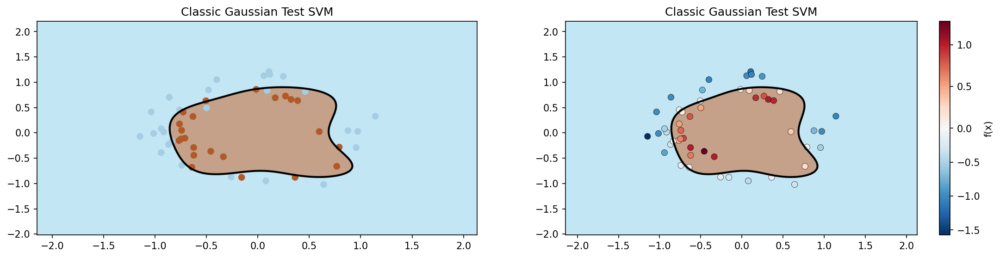

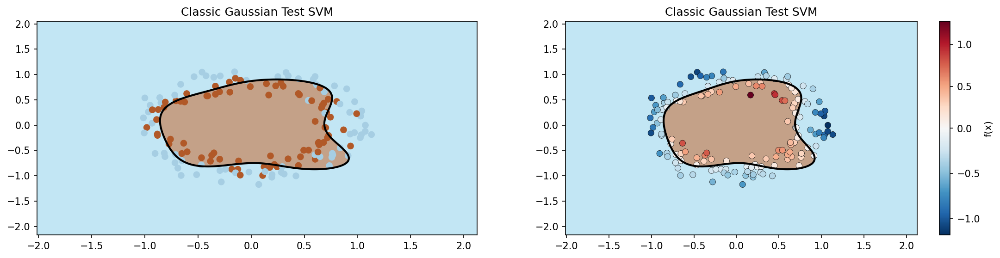

#########################
Test Accuracy : 0.7133
Test AUROC    : 0.8287
Test AUPRC    : 0.8250
#########################


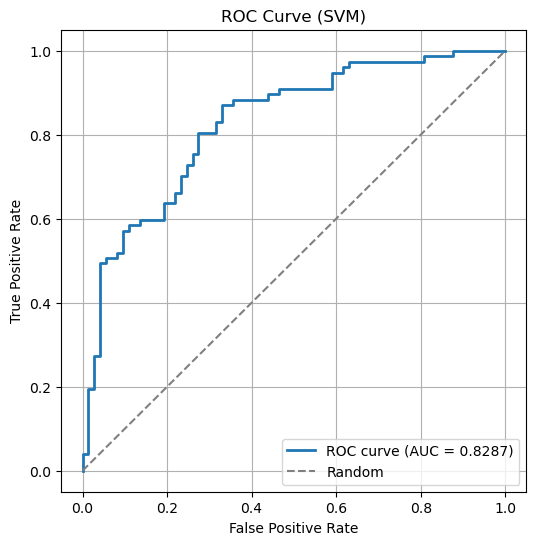

0.4635545807784938
0.7277101505719122


In [38]:
C = 1
gamma = 2.9

P, q, G, h, A, b, K_train_train = Solver_Parameter()

sol = Solver_SVM(P, q, G, h, A, b)

alpha = np.array(sol['x']).reshape(-1)

acc_train, auroc_train, auprc_train, scores_train = evaluate_train(
            y_train,
            alpha,
            K_train_train,
        )

acc_test, auroc_test, auprc_test = evaluate_test(
        y_test,
        Test_evlauation(alpha, K_train_train)
    )

scores_test = Test_evlauation(alpha, K_train_train)

gap_acc, gap_auroc, gap_auprc = Evaluate_Overfitting(acc_train, acc_test, auroc_train, auroc_test, auprc_train, auprc_test)

print("#" * 25)
print(f"Gap Accuracy : {gap_acc:.4f}")
print(f"Gap AUROC    : {gap_auroc:.4f}")
print(f"Gap AUPRC    : {gap_auprc:.4f}")
print("#" * 25)

Loss_train, Loss_test, Loss_train_mean, Loss_test_mean= Hinge_Loss(alpha, K_train_train, scores_train)


Train_Graph(alpha, K_train_train, scores_train)

Test_Graph(alpha, K_train_train, scores_test)

Evaluate(alpha, K_train_train)

print(Loss_train_mean)
print(Loss_test_mean)

In [39]:
# scores_Train = [x for x in scores_train if x != 0]

fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x=X_train[:, 0],
        y= X_train[:, 1],
        z=scores_train,
                mode='markers',
        marker=dict(
            size=3,
            color=scores_train,
            colorscale='RdBu',
            colorbar=dict(title='f(x)')
        )
    )
)


fig.show()

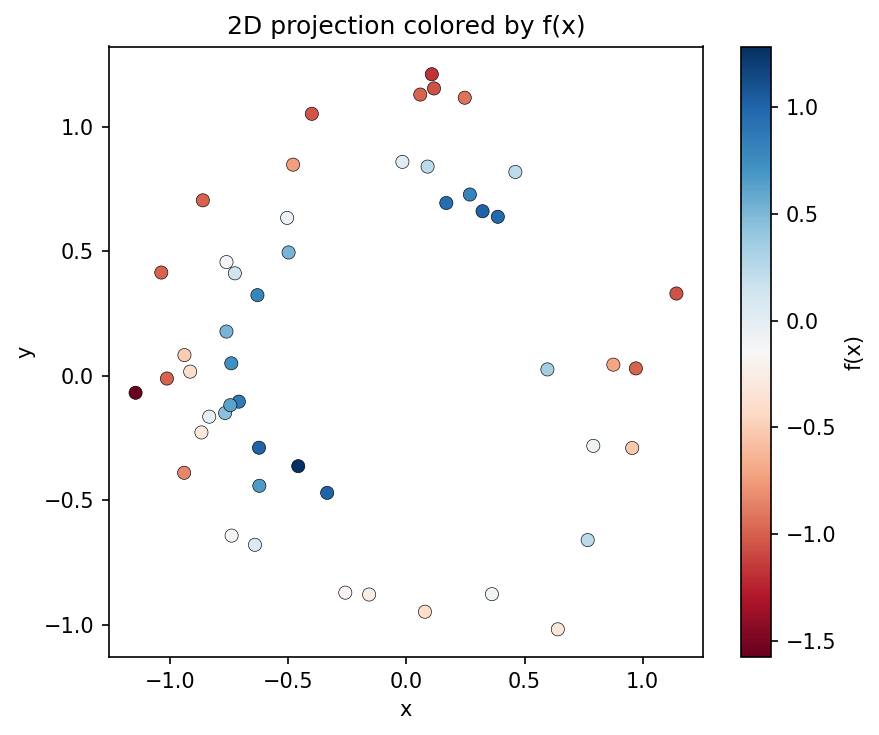

In [40]:
plt.figure(figsize=(6, 5), dpi=150)

plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=scores_train,        # f(x)
    cmap="RdBu",
    s=40,
    edgecolors="k",
    linewidths=0.3
)

plt.colorbar(label="f(x)")
plt.xlabel("x")
plt.ylabel("y")
plt.title("2D projection colored by f(x)")

plt.tight_layout()
plt.show()

In [41]:
# scores_Test = [x for x in scores_test if x != 0]

fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x=X_test[:, 0],
        y= X_test[:, 1],
        z=scores_test,
                mode='markers',
        marker=dict(
            size=3,
            color=scores_test,
            colorscale='RdBu',
            colorbar=dict(title='f(x)')
        )
    )
)


fig.show()